In [17]:
import tensorflow as tf

In [ ]:
%load_ext tensorboard

In [ ]:
import pathlib
import os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import tensorflow_hub as hub
np.set_printoptions(precision=4)
import matplotlib.pyplot as plt
import PIL
import scipy.ndimage as ndimage
from datetime import datetime
from os import getcwd
import sklearn.metrics
import itertools
import io

In [ ]:
print("TensorFlow version:", tf.__version__)


TensorFlow version: 2.15.0


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [18]:
!pip install kaggle
from google.colab import files
files.upload()


Saving kaggle.json to kaggle (1).json


{'kaggle (1).json': b'{"username":"gianpanjaitan","key":"6088892f956e232f77f7713ec25c2393"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/


In [ ]:
!kaggle datasets download -d jiwasambhuwara/food-ingredients

100% 794M/798M [00:06<00:00, 153MB/s]
100% 798M/798M [00:06<00:00, 134MB/s]


In [ ]:
!unzip food-ingredients

Streaming output truncated to the last 5000 lines.
  inflating: Food Dataset/val/Anggur/475.jpg  
  inflating: Food Dataset/val/Anggur/476.jpg  
  inflating: Food Dataset/val/Anggur/477.jpg  
  inflating: Food Dataset/val/Anggur/479.jpg  
  inflating: Food Dataset/val/Anggur/482.jpg  
  inflating: Food Dataset/val/Anggur/491.jpg  
  inflating: Food Dataset/val/Anggur/497.jpg  
  inflating: Food Dataset/val/Anggur/499.jpg  
  inflating: Food Dataset/val/Anggur/50.jpg  
  inflating: Food Dataset/val/Anggur/58.jpg  
  inflating: Food Dataset/val/Anggur/63.jpg  
  inflating: Food Dataset/val/Anggur/64.jpg  
  inflating: Food Dataset/val/Anggur/7.jpg  
  inflating: Food Dataset/val/Anggur/72.jpg  
  inflating: Food Dataset/val/Anggur/73.jpg  
  inflating: Food Dataset/val/Anggur/75.jpg  
  inflating: Food Dataset/val/Anggur/87.jpg  
  inflating: Food Dataset/val/Anggur/89.jpg  
  inflating: Food Dataset/val/Anggur/90.jpg  
  inflating: Food Dataset/val/Anggur/94.jpg  
  inflating: Food Data

In [ ]:
list_ds = tf.data.Dataset.list_files('/content/drive/MyDrive/Dataset_capstone')

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Apply data augmentation
train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

validation_datagen = ImageDataGenerator(rescale=1/255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Flow training images in batches of 128 using train_datagen generator
train_generator = train_datagen.flow_from_directory(
        '/content/Food Dataset/train',  # This is the source directory for training images
        target_size=(300, 300),  # All images will be resized to 300x300
        batch_size=256,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='categorical')

# Flow training images in batches of 128 using train_datagen generator
validation_generator = validation_datagen.flow_from_directory(
        '/content/Food Dataset/val',  # This is the source directory for validation images
        target_size=(300, 300),  # All images will be resized to 300x300
        batch_size=32,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='categorical')

test_generator = test_datagen.flow_from_directory(
    '/content/Food Dataset/test',
    target_size=(300, 300),
    batch_size=32,
    class_mode='categorical'
)

Found 20038 images belonging to 54 classes.
Found 5179 images belonging to 54 classes.
Found 2574 images belonging to 54 classes.


In [ ]:
# ... (Previous code for setting up generators)

# Check the class labels
print("Class labels for training set:")
print(train_generator.class_indices)

print("\nClass labels for validation set:")
print(validation_generator.class_indices)


Class labels for training set:
{'Alpukat': 0, 'Anggur': 1, 'Apel': 2, 'Asparagus': 3, 'Bawang_bombay': 4, 'Bawang_merah': 5, 'Bawang_putih': 6, 'Bayam': 7, 'Brokoli': 8, 'Buah_naga': 9, 'Cabai': 10, 'Ceker_ayam': 11, 'Dada_ayam': 12, 'Daun_Bawang': 13, 'Delima': 14, 'Durian': 15, 'Jagung': 16, 'Jahe': 17, 'Jambu_Air': 18, 'Jeruk': 19, 'Kacang_Kedelai': 20, 'Kacang_Mete': 21, 'Kacang_polong': 22, 'Kacang_tanah': 23, 'Kambing': 24, 'Kangkung': 25, 'Kelapa': 26, 'Kembang_Kol': 27, 'Kentang': 28, 'Kiwi': 29, 'Klengkeng': 30, 'Kol': 31, 'Labu': 32, 'Labu_Siam': 33, 'Leci': 34, 'Lemon': 35, 'Lengkuas': 36, 'Lobak': 37, 'Mangga': 38, 'Melon': 39, 'Mentimun': 40, 'Nanas': 41, 'Nangka': 42, 'Nasi_merah': 43, 'Nasi_putih': 44, 'Paha_ayam': 45, 'Paprika': 46, 'Pare': 47, 'Pepaya': 48, 'Pir': 49, 'Pisang': 50, 'Pokcoy': 51, 'Rambutan': 52, 'Salmon': 53, 'Sapi': 54, 'Sawi_Putih': 55, 'Sayap_Ayam': 56, 'Selada': 57, 'Semangka': 58, 'Singkong': 59, 'Stroberi': 60, 'Tahu': 61, 'Tauge': 62, 'Telur': 63

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE
num_classes = train_generator.num_classes
train_ds = tf.data.Dataset.from_generator(
    lambda: train_generator,
    output_signature=(
        tf.TensorSpec(shape=(None, 300, 300, 3), dtype=tf.float32),
        tf.TensorSpec(shape=(None, num_classes), dtype=tf.float32)
    )
)
print(num_classes)

54


In [ ]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(128, 300, 300, 3)
(128, 3)


In [ ]:
img_height = 300
img_width = 300

In [ ]:
from tensorflow import keras
base_model = keras.applications.Xception(
    weights="imagenet",
    input_shape=(300, 300, 3),
    include_top=False,
)

base_model.trainable = False

# Buat model baru di atas
inputs = keras.Input(shape=(300, 300, 3))

# Tambahkan lapisan normalisasi tanpa mengatur bobot
norm_layer = keras.layers.experimental.preprocessing.Normalization()
x = norm_layer(inputs)

# Lanjutkan dengan model
x = base_model(x, training=False)
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dropout(0.2)(x)
outputs = keras.layers.Dense(num_classes, activation="softmax")(x)
model = keras.Model(inputs, outputs)


83683744/83683744 [==============================] - 0s 0us/step


In [ ]:
def plot_confusion_matrix(cm, class_names):
    """
    Returns a matplotlib figure containing the plotted confusion matrix.

    Args:
       cm (array, shape = [n, n]): a confusion matrix of integer classes
       class_names (array, shape = [n]): String names of the integer classes
    """

    figure = plt.figure(figsize=(20, 20))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title("Confusion matrix")
    plt.colorbar()
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names, rotation=90)
    plt.yticks(tick_marks, class_names)
    plt.tick_params(axis='both', which='major', labelsize=10)
    plt.tick_params(axis='both', which='minor', labelsize=8)

    # Normalize the confusion matrix.
    cm = np.around(cm.astype('float') / cm.sum(axis=1)[:, np.newaxis], decimals=2)

    # Use white text if squares are dark; otherwise black.
    threshold = cm.max() / 2.

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        color = "white" if cm[i, j] > threshold else "black"
        plt.text(j, i, cm[i, j], horizontalalignment="center", color=color)

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    return figure

In [ ]:
# UNQ_C1
# GRADED CODE: tensorboard_callback

# Clear logs prior to logging data.
!rm -rf logs/image

# Create log directory
logdir = "logs/image/" + datetime.now().strftime("%Y%m%d-%H%M%S")

# EXERCISE: Define a TensorBoard callback. Use the log_dir parameter
# to specify the path to the directory where you want to save the
# log files to be parsed by TensorBoard.
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir, histogram_freq=1)

file_writer_cm = tf.summary.create_file_writer(logdir + '/cm')

In [ ]:
# UNQ_C2
# GRADED function: plot_to_image

def plot_to_image(figure):
    """
    Converts the matplotlib plot specified by 'figure' to a PNG image and
    returns it. The supplied figure is closed and inaccessible after this call.
    """

    buf = io.BytesIO()

    # EXERCISE: Use plt.savefig to save the plot to a PNG in memory.
    # YOUR CODE HERE
    plt.savefig(buf, format='png')
    # Closing the figure prevents it from being displayed directly inside
    # the notebook.
    plt.close(figure)
    buf.seek(0)

    # EXERCISE: Use tf.image.decode_png to convert the PNG buffer
    # to a TF image. Make sure you use 4 channels.
    image = tf.image.decode_png(buf.getvalue(), channels=4)

    # EXERCISE: Use tf.expand_dims to add the batch dimension
    image =tf.expand_dims(image, 0)

    return image

In [ ]:
def get_labels_from_generator(generator):
    labels = []
    for i in range(len(generator)):
        _, label_batch = next(generator)
        labels.extend(np.argmax(label_batch, axis=1))  # mengonversi one-hot ke integer jika perlu
    return np.array(labels)

# Mengekstrak label dari test generator
test_labels = get_labels_from_generator(test_generator)


In [ ]:
# UNQ_C3
# GRADED function: log_confusion_matrix

def log_confusion_matrix(epoch, logs):

    # EXERCISE: Use the model to predict the values from the test_images.
    test_pred_raw = model.predict(test_generator)
    test_pred = np.argmax(test_pred_raw, axis=1)

    # EXERCISE: Calculate the confusion matrix using sklearn.metrics
    cm = sklearn.metrics.confusion_matrix(test_labels, test_pred)

    figure = plot_confusion_matrix(cm, class_names=test_generator.class_indices)
    cm_image = plot_to_image(figure)

    # Log the confusion matrix as an image summary.
    with file_writer_cm.as_default():
        tf.summary.image("Confusion Matrix", cm_image, step=epoch)

# Define the per-epoch callback.
cm_callback = keras.callbacks.LambdaCallback(on_epoch_end=log_confusion_matrix)

In [16]:
%tensorboard --logdir logs/image

model.compile(
    optimizer=keras.optimizers.Adam(),
    loss=keras.losses.CategoricalCrossentropy(from_logits=False),
    metrics=[keras.metrics.CategoricalAccuracy()],
)
epochs = 50
history = model.fit(
  train_ds,  # Pastikan ini sesuai dengan generator data pelatihan Anda
  validation_data=validation_generator,  # Pastikan ini sesuai dengan generator data validasi Anda
  epochs=epochs, steps_per_epoch= 35,callbacks=[tensorboard_callback, cm_callback]
)
model.save('my_model.h5')
# Mengunduh file model .h5 ke sistem lokal
from google.colab import files
files.download('my_model.h5')

<IPython.core.display.Javascript object>

Epoch 1/50
35/35 [==============================] - 316s 8s/step - loss: 2.9536 - categorical_accuracy: 0.3508 - val_loss: 2.0540 - val_categorical_accuracy: 0.6654
Epoch 2/50
35/35 [==============================] - 262s 8s/step - loss: 1.6184 - categorical_accuracy: 0.7029 - val_loss: 1.2747 - val_categorical_accuracy: 0.7376
Epoch 3/50
35/35 [==============================] - 248s 7s/step - loss: 1.1135 - categorical_accuracy: 0.7790 - val_loss: 0.9698 - val_categorical_accuracy: 0.7911
Epoch 4/50
35/35 [==============================] - 228s 7s/step - loss: 0.9162 - categorical_accuracy: 0.8032 - val_loss: 0.8270 - val_categorical_accuracy: 0.8112
Epoch 5/50
35/35 [==============================] - 217s 6s/step - loss: 0.7775 - categorical_accuracy: 0.8312 - val_loss: 0.7237 - val_categorical_accuracy: 0.8307
Epoch 6/50
35/35 [==============================] - 215s 6s/step - loss: 0.7090 - categorical_accuracy: 0.8392 - val_loss: 0.6628 - val_categorical_accuracy: 0.8378
Epoch 7/50

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [19]:


def predictWithTestDataset(model, test_generator):
    labelMappings = {v: k for k, v in test_generator.class_indices.items()}

    image_batch, label_batch = test_generator.next()
    predictions = model.predict_on_batch(image_batch)
    predicted_classes = np.argmax(predictions, axis=1)

    # If your labels are one-hot encoded, this will convert them to class indices
    label_batch_indices = np.argmax(label_batch, axis=1)

    correctPredictions = 0
    plt.figure(figsize=(20, 20))
    for i in range(len(predicted_classes)):
        ax = plt.subplot(8, 5, i + 1)

        # Convert to uint8 if necessary and rescale for display
        img = image_batch[i].squeeze()
        if img.dtype != np.uint8:
            img = (img * 255).astype(np.uint8)

        plt.imshow(img)

        predicted_class_index = predicted_classes[i]
        predictionLabel = labelMappings[predicted_class_index]

        gt_class_index = label_batch_indices[i]
        gtLabel = labelMappings[gt_class_index]

        if gtLabel == predictionLabel:
            correctPredictions += 1

        plt.title(f"P={predictionLabel} GT={gtLabel}")
        plt.axis("off")

    accuracy = correctPredictions / len(predicted_classes)
    print(f"Accuracy: {accuracy:.2f}")
    plt.show()

# Make sure to pass the model and test_generator when calling the function
# predictWithTestDataset(model, test_generator)


Accuracy: 0.91


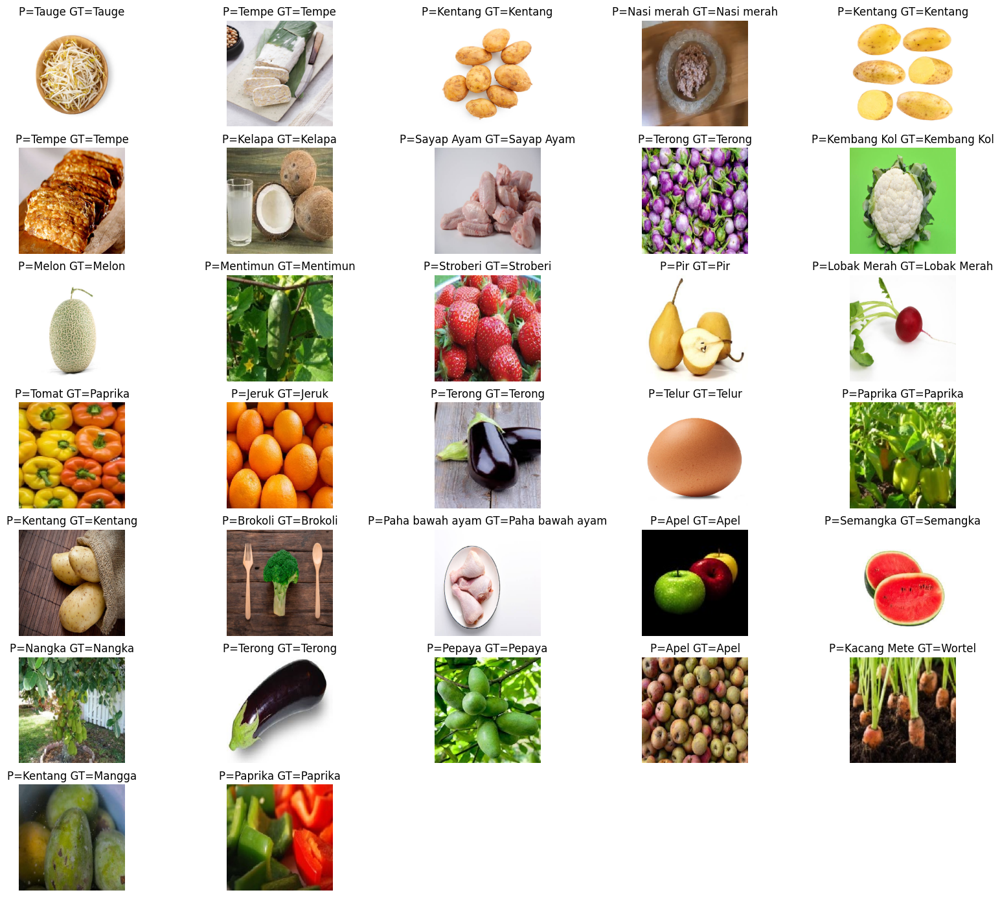

In [21]:
predictWithTestDataset(model, test_generator)
